<a href="https://colab.research.google.com/github/ozdemrburak/Nutrition_Assistant_using_Deep_Learning/blob/main/ResNetRegressor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Kaggle'dan veri seti yükleme ve ön işleme

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("siddhantrout/nutrition5k-dataset")

print("Path to dataset files:", path)

100%|██████████| 2.29G/2.29G [00:17<00:00, 138MB/s]

Extracting files...


In [ ]:
import pickle

images_path = path + "/dish_images.pkl"
with open(images_path, 'rb') as f:
    images = pickle.load(f)

In [ ]:
images.head()

,dish,rgb_image,depth_image
0,dish_1559243887,b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...,b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...
1,dish_1563568319,b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...,b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...
2,dish_1558641007,b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...,b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...
3,dish_1558109945,b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...,b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...
4,dish_1563216412,b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...,b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...


In [ ]:
images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3490 entries, 0 to 3489
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   dish         3490 non-null   object
 1   rgb_image    3490 non-null   object
 2   depth_image  3490 non-null   object
dtypes: object(3)
memory usage: 81.9+ KB


In [ ]:
import pandas as pd
df_i = pd.read_excel(path + "/dish_ingredients.xlsx")
df_i.head()

,dish_id,ingr_id,ingr_name,grams,calories,fat,carb,protein
0,dish_1561662216,ingr_0000000508,soy sauce,3.398568,1.801241,0.020391,0.166530,0.275284
1,dish_1561662216,ingr_0000000122,garlic,2.124105,3.164916,0.010621,0.700955,0.135943
2,dish_1561662216,ingr_0000000026,white rice,8.496420,11.045346,0.025489,2.378998,0.229403
3,dish_1561662216,ingr_0000000524,parsley,0.213397,0.079170,0.001707,0.013657,0.006189
4,dish_1561662216,ingr_0000000094,onions,1.707173,0.682869,0.001707,0.153646,0.018779


In [ ]:
# dish_id'ye göre gruplama ve sayısal kolonları toplama, dishes.xslx'de bazı değerler eksikti. Burada malzemelerin calori vs. değerlerini toplayıp doğru değerleri elde ettik.
df_new = df_i.groupby('dish_id')[['grams', 'calories', 'fat', 'carb', 'protein']].sum().reset_index()

print("Yeni DataFrame:")
print(df_new.head())
print(f"\nYeni DataFrame boyutu: {df_new.shape}")
print(f"\nVeri tipleri:")
print(df_new.dtypes)

Yeni DataFrame:
           dish_id  grams  calories    fat   carb  protein
0  dish_1550704750   83.0    136.95  2.988   0.00    25.73
1  dish_1550704903   76.0     30.40  0.152   6.84     1.52
2  dish_1550705288  100.0     77.00  0.100  17.00     2.00
3  dish_1550705370   49.0    122.50  7.350   0.00    12.74
4  dish_1550705445   40.0      4.00  0.000   0.80     0.40

Yeni DataFrame boyutu: (5006, 6)

Veri tipleri:
dish_id      object
grams       float64
calories    float64
fat         float64
carb        float64
protein     float64
dtype: object


In [ ]:
images_subset = images[['dish', 'rgb_image']]
df_merged = images_subset.merge(df_new, left_on="dish", right_on="dish_id", how = "inner")
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3490 entries, 0 to 3489
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   dish       3490 non-null   object 
 1   rgb_image  3490 non-null   object 
 2   dish_id    3490 non-null   object 
 3   grams      3490 non-null   float64
 4   calories   3490 non-null   float64
 5   fat        3490 non-null   float64
 6   carb       3490 non-null   float64
 7   protein    3490 non-null   float64
dtypes: float64(5), object(3)
memory usage: 218.3+ KB


In [ ]:
def remove_dish_ids(df_merged, txt_file_path):
    """
    Set operations kullanarak daha hızlı silme işlemi
    """

    # Txt dosyasını oku
    with open(txt_file_path, 'r', encoding='utf-8') as file:
        dish_ids_to_remove = set(line.strip() for line in file if line.strip())

    print(f"Silinecek dish_id sayısı: {len(dish_ids_to_remove)}")

    # Set operations kullanarak filtreleme
    original_size = len(df_merged)
    mask = ~df_merged['dish_id'].isin(dish_ids_to_remove)
    df_cleaned = df_merged[mask].copy()

    final_size = len(df_cleaned)
    print(f"Orijinal: {original_size} -> Temizlenmiş: {final_size}")
    print(f"Silinen: {original_size - final_size} satır")

    return df_cleaned

In [ ]:
dataset_cleaned = remove_dish_ids(df_merged, "exclusion.txt")

FileNotFoundError: [Errno 2] No such file or directory: 'exclusion.txt'

In [ ]:
dataset_cleaned.info()

# PyTorch Custom Dataset

In [ ]:
import torch
import pandas as pd
import numpy as np
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torchvision import transforms
import io
from sklearn.preprocessing import StandardScaler

In [ ]:
class NutritionDataset(Dataset):
    def __init__(self, df, target_columns, transform=None):
        self.df = df[df['rgb_image'].notna()].reset_index(drop=True)
        self.transform = transform
        self.target_columns = target_columns
        self.targets = self.df[self.target_columns].values

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_data = row['rgb_image']
        image = Image.open(io.BytesIO(image_data)).convert('RGB')
        target_data = torch.tensor(self.targets[idx], dtype=torch.float32)
        if self.transform:
            image = self.transform(image)
        return image, target_data


In [ ]:

def create_data_loaders_with_rgb(df, batch_size=32, train_split=0.85, target_columns=None, scaler = None):
  #dataset split
  df_shuffled = df.sample(frac=1).reset_index(drop=True)
  train_size = int(len(df_shuffled) * train_split)
  train_df = df_shuffled[:train_size]
  val_df = df_shuffled[train_size:]
  #scaler
  if target_columns is None:
        target_columns = ['grams', 'calories', 'fat', 'carb', 'protein']
  scaler = StandardScaler()
  train_df[target_columns] = scaler.fit_transform(train_df[target_columns])
  val_df[target_columns]   = scaler.transform(val_df[target_columns])
  #transform
  train_transform = transforms.Compose([
      transforms.Resize((224, 224)),
      transforms.RandomHorizontalFlip(p = 0.4),
      transforms.ToTensor(),
      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
  ])
  val_transform = transforms.Compose([
      transforms.Resize((224, 224)),
      transforms.ToTensor(),
      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
  ])
  #dataset class'ını çağırarak dataset oluşturma
  train_dataset = NutritionDataset(train_df, target_columns, transform= train_transform)
  val_dataset = NutritionDataset(val_df, target_columns, transform= val_transform)
  #dataloaders oluşturma
  train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
  val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

  return train_loader, val_loader

In [ ]:
train_data, val_data = create_data_loaders_with_rgb(dataset_cleaned)

/tmp/ipython-input-4073709631.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df[target_columns] = scaler.fit_transform(train_df[target_columns])
/tmp/ipython-input-4073709631.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_df[target_columns]   = scaler.transform(val_df[target_columns])


In [ ]:
# train_data'nın ilk elemanına erişme
train_iter = iter(train_data)
first_train_element = next(train_iter)

# val_data'nın ilk elemanına erişme
val_iter = iter(val_data)
first_val_element = next(val_iter)

print("First element of train_data:")
print(f"Image batch shape: {first_train_element[0].shape}")
print(f"Target batch shape: {first_train_element[1].shape}")

print("\nFirst element of val_data:")
print(f"Image batch shape: {first_val_element[0].shape}")
print(f"Target batch shape: {first_val_element[1].shape}")

First element of train_data:
Image batch shape: torch.Size([32, 3, 224, 224])
Target batch shape: torch.Size([32, 5])

First element of val_data:
Image batch shape: torch.Size([32, 3, 224, 224])
Target batch shape: torch.Size([32, 5])


# ResNet101 Model Class
ResNet101'in son katmanında fully connected layer 1000 output feature'a sahip. Bunu değiştirmektense bu katmana ek bir RegressionHead yazmak daha doğru diye düşünüyorum. 2 katmanlı bir MLP işimizi görecektir.

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models


In [ ]:
class ResNetRegressor(nn.Module):
  def __init__(self, num_outputs = 5):
    super(ResNetRegressor, self).__init__()
    self.backbone = models.resnet101(pretrained = True)
    #self.backbone.fc = nn.Identity()
    self.reg_head = nn.Sequential(
        nn.ReLU(),
        nn.Dropout(0.3),
        nn.Linear(in_features=1000, out_features = num_outputs)
    )
  def forward(self, x):
    x = self.backbone(x)
    x= self.reg_head(x)
    return x

In [ ]:
model = ResNetRegressor(num_outputs=5)
print(model)

ResNetRegressor(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
 

# Model Eğitim Fonksiyonları

In [ ]:
from tqdm.auto import tqdm
from timeit import default_timer as timer
from torch.optim import optimizer
from torch.optim.lr_scheduler import ReduceLROnPlateau

In [ ]:
from sklearn.metrics import r2_score

def r2_score_torch(y_true, y_pred):
    y_true_np = y_true.detach().cpu().numpy()
    y_pred_np = y_pred.detach().cpu().numpy()
    return r2_score(y_true_np, y_pred_np)


In [ ]:
def rmse_torch(y_true: torch.Tensor, y_pred: torch.Tensor):
    """
    y_true, y_pred: torch.Tensor (batch veya tüm dataset)
    """
    mse = torch.mean((y_true - y_pred) ** 2)
    rmse = torch.sqrt(mse)
    return rmse

In [ ]:
def train_step(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               device: torch.device):
  model.train()
  train_loss = 0.0
  train_r2 = 0.0
  train_rmse = 0.0
  for batch, (X, y) in enumerate(dataloader):
    X, y = X.to(device), y.to(device)
    y_pred = model(X)
    loss = loss_fn(y_pred, y)
    train_loss += loss.item()
    train_r2 += r2_score_torch(y, y_pred)
    train_rmse += rmse_torch(y, y_pred).item()
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

  train_loss = train_loss / len(dataloader)
  train_r2 = train_r2 / len(dataloader)
  train_rmse = train_rmse / len(dataloader)
  return train_loss, train_r2, train_rmse

In [ ]:
def val_step(model: torch.nn.Module,
             dataloader: torch.utils.data.DataLoader,
             loss_fn: torch.nn.Module,
             device: torch.device):
  model.eval()
  val_loss = 0.0
  val_r2 = 0.0
  val_rmse = 0.0
  with torch.inference_mode():
    for batch, (X, y) in enumerate(dataloader):
      X, y = X.to(device), y.to(device)
      y_pred_logits = model(X)
      loss = loss_fn(y_pred_logits, y)
      val_loss += loss.item()
      val_r2 += r2_score_torch(y, y_pred_logits)
      val_rmse += rmse_torch(y, y_pred_logits).item()

    val_loss = val_loss / len(dataloader)
    val_r2 = val_r2 / len(dataloader)
    val_rmse = val_rmse / len(dataloader)
  return val_loss, val_r2, val_rmse

In [ ]:
def train_loop(model: torch.nn.Module,
               train_dataloader: torch.utils.data.DataLoader,
               test_dataloader: torch.utils.data.DataLoader,
               val_dataloader: torch.utils.data.DataLoader,
               optimizer: torch.optim.Optimizer,
               loss_fn: torch.nn.Module,
               scheduler: torch.optim.lr_scheduler,
               epochs: int,
               device: torch.device):
  results = {
      "train_loss": [],
      "train_r2": [],
      "train_rmse": [],
      "val_loss": [],
      "val_r2": [],
      "val_rmse": [],
      "optimizer_lr": []
  }
  early_stopper = EarlyStopper(patience=8, min_delta=0.001, save_dir = "/content/checkpoints", )
  for epoch in tqdm(range(epochs)):
    train_loss, train_r2, train_rmse = train_step(model, train_dataloader, loss_fn, optimizer, device) # Corrected argument order
    val_loss, val_r2, val_rmse = val_step(model, val_dataloader, loss_fn, device)
    print(f"Epoch: {epoch+1} | Train loss: {train_loss:.4f} | Train R2: {train_r2:.2f} | Train RMSE: {train_rmse:.4f} | Val loss: {val_loss:.4f} | Val R2: {val_r2:.2f} | Val RMSE: {val_rmse:.4f} | LR: {optimizer.param_groups[0]['lr']} ")
    results["train_loss"].append(train_loss)
    results["train_r2"].append(train_r2)
    results["train_rmse"].append(train_rmse)
    results["val_loss"].append(val_loss)
    results["val_r2"].append(val_r2)
    results["val_rmse"].append(val_rmse)
    results["optimizer_lr"].append(optimizer.param_groups[0]['lr'])
    if early_stopper.early_stop(val_loss, model, epoch):
      print("Early stopping triggered")
      break
    scheduler.step(val_loss)
  return results

# Model Eğitimi

In [ ]:
torch.cuda.empty_cache()

In [ ]:
#source: https://stackoverflow.com/questions/71998978/early-stopping-in-pytorch
import torch
import os

class EarlyStopper:
    def __init__(self, patience=3, min_delta=0.001, save_dir="/content/checkpoints"):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_validation_loss = float('inf')
        self.save_dir = save_dir
        os.makedirs(save_dir, exist_ok=True)

    def early_stop(self, validation_loss, model, epoch):
        stop = False
        if validation_loss < self.min_validation_loss - self.min_delta:
            self.min_validation_loss = validation_loss
            self.counter = 0
            save_path = os.path.join(self.save_dir, f"best_model.pth")
            torch.save(model.state_dict(), save_path)
            print(f"Model saved at {save_path}")
        else:
            self.counter += 1
            if self.counter >= self.patience:
                stop = True
        return stop


In [ ]:
NUM_EPOCHS = 75
model = ResNetRegressor(num_outputs=5)
#model.load_state_dict(torch.load("model_state_dict.pth"))
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
loss_fn = nn.L1Loss()
optimizer = torch.optim.AdamW(params = model.parameters(), lr = 0.001)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=4)
start_time = timer()
model_results = train_loop(model = model,
                           train_dataloader = train_data,
                           test_dataloader = val_data,
                           val_dataloader = val_data,
                           optimizer = optimizer,
                           loss_fn = loss_fn,
                           scheduler = scheduler,
                           epochs = NUM_EPOCHS,
                           device = device)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch: 1 | Train loss: 0.6013 | Train R2: 0.17 | Train RMSE: 0.8324 | Val loss: 0.6253 | Val R2: -0.32 | Val RMSE: 1.0624 | LR: 0.001 
Model saved at /content/checkpoints/best_model.pth
Epoch: 2 | Train loss: 0.5024 | Train R2: 0.45 | Train RMSE: 0.7193 | Val loss: 0.5739 | Val R2: 0.29 | Val RMSE: 0.7879 | LR: 0.001 
Model saved at /content/checkpoints/best_model.pth
Epoch: 3 | Train loss: 0.4806 | Train R2: 0.48 | Train RMSE: 0.6936 | Val loss: 0.4852 | Val R2: 0.35 | Val RMSE: 0.6891 | LR: 0.001 
Model saved at /content/checkpoints/best_model.pth
Epoch: 4 | Train loss: 0.4607 | Train R2: 0.50 | Train RMSE: 0.6692 | Val loss: 0.6257 | Val R2: -0.07 | Val RMSE: 0.9209 | LR: 0.001 
Epoch: 5 | Train loss: 0.4505 | Train R2: 0.54 | Train RMSE: 0.6528 | Val loss: 0.5435 | Val R2: 0.31 | Val RMSE: 0.8172 | LR: 0.001 
Epoch: 6 | Train loss: 0.4346 | Train R2: 0.56 | Train RMSE: 0.6389 | Val loss: 0.5928 | Val R2: -0.52 | Val RMSE: 0.8543 | LR: 0.001 
Epoch: 7 | Train loss: 0.4273 | Train R2

In [ ]:
model_state_dict = torch.save(model.state_dict(), "model_state_dict.pth")

In [ ]:
import pickle

with open("model_results.pkl", "wb") as f:
    pickle.dump(model_results, f)

print("model_results_1_50.pkl dosyası başarıyla kaydedildi.")

model_results_1_50.pkl dosyası başarıyla kaydedildi.


In [ ]:
import torch
import torch.nn.functional as F

model.eval()
with torch.inference_mode():
    X, y = next(iter(val_data))
    X, y = X.to(device), y.float().to(device)
    y_pred = model(X)

# Per-sample MSE ve MAE
mse_per_sample = F.mse_loss(y_pred, y, reduction='none').mean(dim=1)  # [batch]
mae_per_sample = F.l1_loss(y_pred, y, reduction='none').mean(dim=1)

print("Batch MSE mean:", mse_per_sample.mean().item())
print("Batch MAE mean:", mae_per_sample.mean().item())

# Per-feature errors (averaged over batch)
mse_per_feature = F.mse_loss(y_pred, y, reduction='none').mean(dim=0)  # [5]
mae_per_feature = F.l1_loss(y_pred, y, reduction='none').mean(dim=0)
print("MSE per feature:", mse_per_feature.tolist())
print("MAE per feature:", mae_per_feature.tolist())

# A few example predictions vs targets -> ['grams', 'calories', 'fat', 'carb', 'protein']

for i in range(5):
    print("GT:", y[i].cpu().numpy(), "PRED:", y_pred[i].cpu().numpy())


Batch MSE mean: 0.1344686895608902
Batch MAE mean: 0.2219477891921997
MSE per feature: [0.056787021458148956, 0.07175838202238083, 0.22023612260818481, 0.2471378743648529, 0.07642404735088348]
MAE per feature: [0.16001024842262268, 0.18250904977321625, 0.2744594216346741, 0.30809545516967773, 0.18466466665267944]
GT: [-0.7113137  -1.0684474  -0.94615734 -0.67301226 -0.8725218 ] PRED: [-0.845729   -1.0373262  -0.9797455  -0.48526838 -0.9003922 ]
GT: [0.86623037 0.7708169  0.86571944 0.51908237 0.24167491] PRED: [-0.13495508  0.24224408  0.0420345   1.0168699  -0.294881  ]
GT: [-0.83163494 -0.91104674 -0.7858681  -0.9976198  -0.47589865] PRED: [-0.6989347  -0.88367534 -0.6681346  -0.949119   -0.60723996]
GT: [-1.0054321  -0.23757918  0.25874287 -1.0354874  -0.3198728 ] PRED: [-1.141991   -0.35195124  0.09933786 -0.9306086  -0.44123852]
GT: [-0.4372489  -1.0420479  -0.94905555 -0.6494218  -0.78993016] PRED: [-0.42763597 -1.03428    -0.9490944  -0.62551993 -0.811234  ]


# Metrik Eğrileri

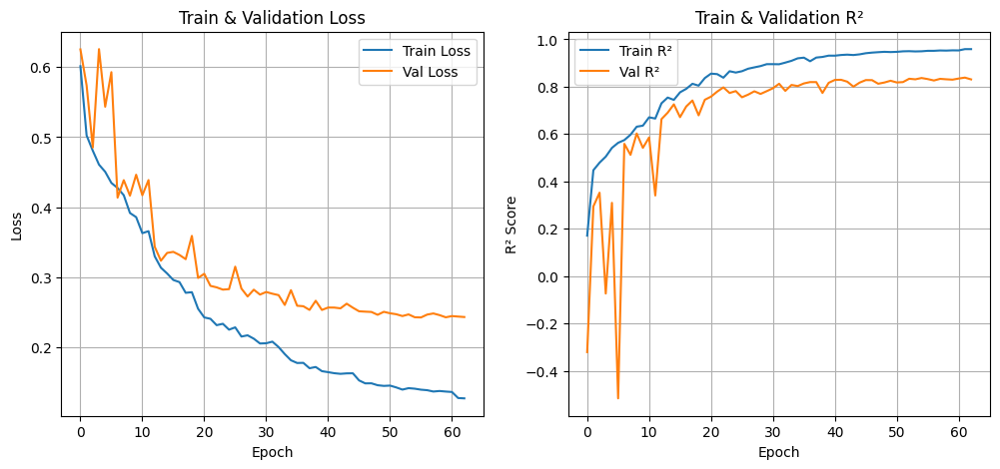

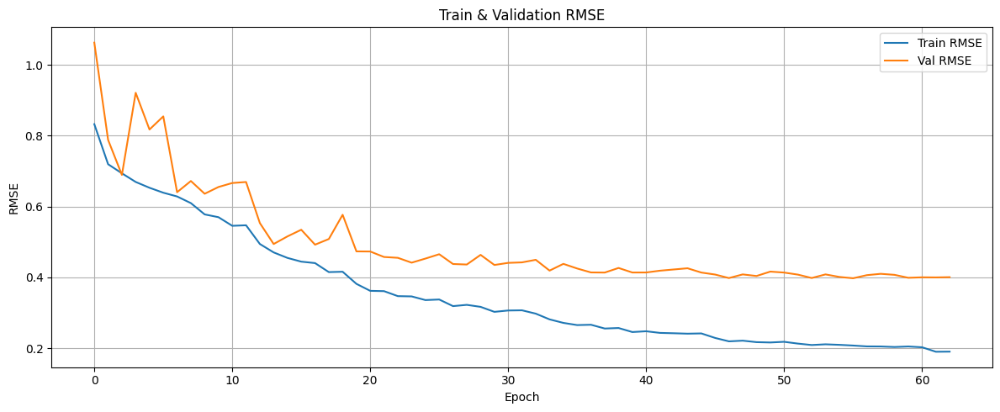

In [ ]:
import matplotlib.pyplot as plt

# Loss grafiği
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(model_results["train_loss"], label="Train Loss")
plt.plot(model_results["val_loss"], label="Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train & Validation Loss")
plt.legend()
plt.grid(True)

# R² grafiği
plt.subplot(1,2,2)
plt.plot(model_results["train_r2"], label="Train R²")
plt.plot(model_results["val_r2"], label="Val R²")
plt.xlabel("Epoch")
plt.ylabel("R² Score")
plt.title("Train & Validation R²")
plt.legend()
plt.grid(True)

# RMSE grafiği
plt.figure(figsize=(12,5))
plt.plot(model_results["train_rmse"], label="Train RMSE")
plt.plot(model_results["val_rmse"], label="Val RMSE")
plt.xlabel("Epoch")
plt.ylabel("RMSE")
plt.title("Train & Validation RMSE")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()
